<h1><font size = 5>Segmenting and Clustering Neighborhoods in Baltimore</font></h1>

In [149]:
!pip install sodapy # uncomment this line if you haven't 

Requirement not upgraded as not directly required: sodapy in /opt/conda/envs/DSX-Python35/lib/python3.5/site-packages
Requirement not upgraded as not directly required: future>=0.17.1 in /opt/conda/envs/DSX-Python35/lib/python3.5/site-packages (from sodapy)
Requirement not upgraded as not directly required: requests>=2.20.0 in /opt/conda/envs/DSX-Python35/lib/python3.5/site-packages (from sodapy)
Requirement not upgraded as not directly required: chardet<3.1.0,>=3.0.2 in /opt/conda/envs/DSX-Python35/lib/python3.5/site-packages (from requests>=2.20.0->sodapy)
Requirement not upgraded as not directly required: certifi>=2017.4.17 in /opt/conda/envs/DSX-Python35/lib/python3.5/site-packages (from requests>=2.20.0->sodapy)
Requirement not upgraded as not directly required: urllib3<1.25,>=1.21.1 in /opt/conda/envs/DSX-Python35/lib/python3.5/site-packages (from requests>=2.20.0->sodapy)
Requirement not upgraded as not directly required: idna<2.9,>=2.5 in /opt/conda/envs/DSX-Python35/lib/python

In [150]:
!conda install shapely # uncomment this line if you haven't 

Fetching package metadata ...........
Solving package specifications: .

# All requested packages already installed.
# packages in environment at /opt/conda/envs/DSX-Python35:
#
shapely                   1.6.4            py35h0c48222_0  


In [151]:
!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't 

Fetching package metadata .............
Solving package specifications: .

# All requested packages already installed.
# packages in environment at /opt/conda/envs/DSX-Python35:
#
folium                    0.5.0                      py_0    conda-forge


Let's download all the dependencies that we will need.

In [152]:
import pandas as pd
import numpy as np
import requests
import json
import folium 
import matplotlib.cm as cm
import matplotlib.colors as colors
import warnings
warnings.filterwarnings("ignore")

from sodapy import Socrata
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from shapely.geometry import mapping, shape
from folium import plugins
from sklearn.cluster import KMeans

## Download and Explore Dataset

Use geopy library to get the latitude and longitude values of Baltimore.

In [153]:
#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

address = 'Baltimore'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

print('The geograpical coordinate of Baltimore are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Baltimore are 39.2908816, -76.610759.


In [154]:
# The code was removed by Watson Studio for sharing.

Download all incedent of Baltimore since 2018

In [155]:
# Unauthenticated client 
client = Socrata("data.baltimorecity.gov", tokenapp)

# dictionaries by sodapy.
results = client.get("m8g9-abgb", limit=1000000 , where="date_extract_y(calldatetime)>=2018", select="description,district,location,priority")

# Convert to pandas DataFrame
calls_df = pd.DataFrame.from_records(results)

Delete all incident that not have location, because we can not determine in which neighborhood it happened

In [156]:
calls_df.dropna(subset=['location'],inplace=True)

In [157]:
print(calls_df.shape)
calls_df.head()

(773813, 4)


,description,district,location,priority
17,Transport,ED,"{'type': 'Point', 'coordinates': [-76.910995, ...",Low
21,Repairs/Service,SE,"{'type': 'Point', 'coordinates': [-76.640145, ...",Non-Emergency
24,Transport,CD,"{'type': 'Point', 'coordinates': [-76.064683, ...",Low
31,Transport,WD,"{'type': 'Point', 'coordinates': [-79.041847, ...",Low
44,INVEST,NE,"{'type': 'Point', 'coordinates': [-79.828213, ...",Low


Now download al neighborhoods of Baltimore with his shape to plot in the map.

In [158]:
# dictionaries by sodapy.
results = client.get("5iam-bd6p", limit=2000, select='name, the_geom')
# Convert to pandas DataFrame
Neighborhood_df = pd.DataFrame.from_records(results)

In [159]:
Neighborhood_df.rename(columns={'name': 'Neighborhood'}, inplace=True)
Neighborhood_df['Neighborhood'] = Neighborhood_df['Neighborhood'].str.upper()
print(Neighborhood_df.shape)
Neighborhood_df.head()

(278, 2)


,Neighborhood,the_geom
0,ABELL,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."
1,ALLENDALE,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."
2,ARCADIA,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."
3,BOYD-BOOTH,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."
4,ARLINGTON,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."


Now we will find the neighborhood of each incident

In [160]:
def getNeighborhood(jsonPoint):
    value = np.nan
    point = shape(jsonPoint)    
    for jsonPolygon, neighborhood in zip(Neighborhood_df['the_geom'], Neighborhood_df['Neighborhood']):
        polygon = shape(jsonPolygon)
        if point.within(polygon):
            value = neighborhood
            break
    return value      

In [161]:
calls_df['Neighborhood'] = calls_df.location.map(lambda x: getNeighborhood(x))

Delete incident that not have neighborhood

In [162]:
calls_df.dropna(subset=['Neighborhood'],inplace=True)

In [163]:
calls_df['Neighborhood'] = calls_df['Neighborhood'].str.upper()
calls_df['description'] = calls_df['description'].str.upper()

In [164]:
print(calls_df.shape)
calls_df.head()

(730009, 5)


,description,district,location,priority,Neighborhood
94,OTHER,ND,"{'type': 'Point', 'coordinates': [-76.609868, ...",Medium,HOMELAND
132,AUTO ACCIDENT,SW,"{'type': 'Point', 'coordinates': [-76.654946, ...",Low,MORRELL PARK
133,911/NO VOICE,CD,"{'type': 'Point', 'coordinates': [-76.617589, ...",Medium,MID-TOWN BELVEDERE
134,911/NO VOICE,WD,"{'type': 'Point', 'coordinates': [-76.635789, ...",Medium,HARLEM PARK
135,911/NO VOICE,TRU,"{'type': 'Point', 'coordinates': [-76.677151, ...",Medium,ALLENDALE


We group incidents by neighborhood

In [165]:
df_group = calls_df.groupby(['Neighborhood']).size().reset_index(name='counts')

In [166]:
df_group = pd.merge(Neighborhood_df, df_group,on='Neighborhood')
print(df_group.shape)
df_group.head()

(278, 3)


,Neighborhood,the_geom,counts
0,ABELL,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",1343
1,ALLENDALE,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",4406
2,ARCADIA,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",560
3,BOYD-BOOTH,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",1265
4,ARLINGTON,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",8339


Create Well Known Text for all neighborhood of Baltimore to plot

In [167]:
features = []
for name,geometry in zip(Neighborhood_df['Neighborhood'], Neighborhood_df['the_geom']):
    properties = {
        'type': 'Feature',
        'properties': {'name':name.upper()},'geometry':geometry
    }
    features.append(properties)    
    
geofeatures = {    
    'features': features,
    'type': 'FeatureCollection'
}

geo_str = json.dumps(geofeatures) 

Get the 20 Neighborhood most danger in baltimore

In [173]:
dftop = df_group.sort_values(by=['counts'], ascending=False)[:20]
dftop.head(20)

,Neighborhood,the_geom,counts
274,BELAIR-EDISON,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",18865
64,DOWNTOWN,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",18813
45,FRANKFORD,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",17685
220,SANDTOWN-WINCHESTER,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",14460
241,UPTON,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",14299
25,BROOKLYN,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",13562
35,CARROLLTON RIDGE,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",10980
194,PENN NORTH,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",10204
42,CENTRAL PARK HEIGHTS,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",9986
29,CANTON,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",9078


## The most dangerous neighborhoods in Baltimore

In [174]:
# create map of Baltimore using latitude and longitude values
map_baltimore = folium.Map(location=[latitude, longitude], zoom_start=12)

# create a numpy array of length 6 and has linear spacing from the minium total immigration to the maximum total immigration
threshold_scale = np.linspace(df_group['counts'].min(),
                              df_group['counts'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration


# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
map_baltimore.choropleth(
    geo_data=geo_str,
    data=df_group,
    columns=['Neighborhood', 'counts'],
    key_on='feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Number of incidents per Neighborhood'
)

# add a marker for every record in the filtered data, use a clustered view
for indx,(name,jsonPoint,count) in enumerate(zip(dftop['Neighborhood'], dftop['the_geom'],dftop['counts'])):
    polygon = shape(jsonPoint)  
    folium.Marker([polygon.centroid.y, polygon.centroid.x], popup = str(indx+1)+'. '+name+' ('+str(count)+')').add_to(map_baltimore)    

# display map
map_baltimore

## Explore Neighborhoods in Baltimore

Define Foursquare Credentials and Version

In [175]:
# The code was removed by Watson Studio for sharing.

Let's create a function to process all information of venues by each neighborhood in Baltimore

In [176]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius

def getNearbyVenues(names, polygons, radius=500):
    
    venues_list=[]
    for name, polygon in zip(names, polygons):
        lat = shape(polygon).centroid.y
        lng = shape(polygon).centroid.x
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Now write the code to run the above function on each neighborhood and create a new dataframe called *baltimore_venues*.

In [177]:
baltimore_venues = getNearbyVenues(names = Neighborhood_df['Neighborhood'],
                                   polygons = Neighborhood_df['the_geom']
                                  )

Let's check the size of the resulting dataframe

In [178]:
print(baltimore_venues.shape)
baltimore_venues.head()

(3581, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,ABELL,39.325947,-76.611394,32nd Street Farmer's Market,39.327362,-76.610851,Farmers Market
1,ABELL,39.325947,-76.611394,Pete's Grille,39.327064,-76.609593,Breakfast Spot
2,ABELL,39.325947,-76.611394,The Book Thing,39.325253,-76.610272,Bookstore
3,ABELL,39.325947,-76.611394,Normal's Books & Records,39.326012,-76.609903,Record Shop
4,ABELL,39.325947,-76.611394,Peabody Heights Brewery,39.324744,-76.610819,Brewery


Now we will filter our dataframe leaving only the restaurants

In [179]:
baltimore_venues = baltimore_venues[baltimore_venues['Venue Category'].str.contains("Restaurant")]

Let's check how many venues were returned for each neighborhood

In [180]:
baltimore_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
ABELL,10,10,10,10,10,10
ARLINGTON,5,5,5,5,5,5
BALTIMORE HIGHLANDS,4,4,4,4,4,4
BARCLAY,11,11,11,11,11,11
BARRE CIRCLE,4,4,4,4,4,4
BAYVIEW,4,4,4,4,4,4
BEECHFIELD,1,1,1,1,1,1
BELAIR-EDISON,2,2,2,2,2,2
BELVEDERE,7,7,7,7,7,7


Let's find out how many unique categories can be curated from all the returned venues

In [181]:
print('There are {} uniques categories.'.format(len(baltimore_venues['Venue Category'].unique())))

There are 43 uniques categories.


## Analyze Each Neighborhood

In [182]:
# one hot encoding
baltimore_onehot = pd.get_dummies(baltimore_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
baltimore_onehot['Neighborhood'] = baltimore_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [baltimore_onehot.columns[-1]] + list(baltimore_onehot.columns[:-1])
baltimore_onehot = baltimore_onehot[fixed_columns]

baltimore_onehot.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Argentinian Restaurant,Asian Restaurant,Belgian Restaurant,Cajun / Creole Restaurant,Caribbean Restaurant,Chinese Restaurant,...,Seafood Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sushi Restaurant,Tapas Restaurant,Thai Restaurant,Theme Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
7,ABELL,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
13,ABELL,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
16,ABELL,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
20,ABELL,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21,ABELL,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


And let's examine the new dataframe size.

In [183]:
baltimore_onehot.shape

(716, 44)

Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [184]:
baltimore_grouped = baltimore_onehot.groupby('Neighborhood').mean().reset_index()
print(baltimore_grouped.shape)
baltimore_grouped.head()

(167, 44)


,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Argentinian Restaurant,Asian Restaurant,Belgian Restaurant,Cajun / Creole Restaurant,Caribbean Restaurant,Chinese Restaurant,...,Seafood Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sushi Restaurant,Tapas Restaurant,Thai Restaurant,Theme Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
0,ABELL,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.1,0.300000,...,0.1,0.00,0.000000,0.0,0.0,0.0,0.1,0.0,0.0,0.0
1,ARLINGTON,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.4,0.200000,...,0.2,0.00,0.200000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,BALTIMORE HIGHLANDS,0.0,0.0,0.000000,0.0,0.0,0.0,0.25,0.0,0.000000,...,0.0,0.25,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,BARCLAY,0.0,0.0,0.272727,0.0,0.0,0.0,0.00,0.0,0.090909,...,0.0,0.00,0.363636,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,BARRE CIRCLE,0.0,0.0,0.500000,0.0,0.0,0.0,0.00,0.0,0.000000,...,0.0,0.00,0.250000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Let's print each neighborhood along with the top 5 most common restaurants

In [185]:
num_top_venues = 5

for hood in baltimore_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = baltimore_grouped[baltimore_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ABELL----
                  venue  freq
0    Chinese Restaurant   0.3
1     Korean Restaurant   0.1
2  Caribbean Restaurant   0.1
3     Indian Restaurant   0.1
4      Ramen Restaurant   0.1


----ARLINGTON----
                             venue  freq
0             Caribbean Restaurant   0.4
1               Chinese Restaurant   0.2
2  Southern / Soul Food Restaurant   0.2
3               Seafood Restaurant   0.2
4                Afghan Restaurant   0.0


----BALTIMORE HIGHLANDS----
                       venue  freq
0  Latin American Restaurant  0.25
1  Cajun / Creole Restaurant  0.25
2  South American Restaurant  0.25
3       Fast Food Restaurant  0.25
4           Ramen Restaurant  0.00


----BARCLAY----
                             venue  freq
0  Southern / Soul Food Restaurant  0.36
1              American Restaurant  0.27
2                Korean Restaurant  0.18
3               Chinese Restaurant  0.09
4        Latin American Restaurant  0.09


----BARRE CIRCLE----
             

### Let's put that into a pandas dataframe

First, let's write a function to sort the venues in descending order.

In [186]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 restaurants for each neighborhood.

In [187]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = baltimore_grouped['Neighborhood']

for ind in np.arange(baltimore_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(baltimore_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ABELL,Chinese Restaurant,Korean Restaurant,Seafood Restaurant,Mexican Restaurant,Indian Restaurant,Caribbean Restaurant,Ramen Restaurant,Thai Restaurant,Belgian Restaurant,Cajun / Creole Restaurant
1,ARLINGTON,Caribbean Restaurant,Chinese Restaurant,Southern / Soul Food Restaurant,Seafood Restaurant,Dumpling Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant
2,BALTIMORE HIGHLANDS,Latin American Restaurant,Fast Food Restaurant,Cajun / Creole Restaurant,South American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant
3,BARCLAY,Southern / Soul Food Restaurant,American Restaurant,Korean Restaurant,Latin American Restaurant,Chinese Restaurant,Eastern European Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant
4,BARRE CIRCLE,American Restaurant,Southern / Soul Food Restaurant,Ethiopian Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant


## Cluster Neighborhoods

Run k-means to cluster the neighborhood into 5 clusters.

In [188]:
# set number of clusters
kclusters = 5

baltimore_grouped_clustering = baltimore_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(baltimore_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 0, 0, 2, 0, 4, 1, 0, 0], dtype=int32)

Let's create a new dataframe that includes the cluster as well as the top 10 restaurants for each neighborhood.

In [189]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

baltimore_merged = Neighborhood_df

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
baltimore_merged = baltimore_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

baltimore_merged.head() # check the last columns!

,Neighborhood,the_geom,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ABELL,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",0.0,Chinese Restaurant,Korean Restaurant,Seafood Restaurant,Mexican Restaurant,Indian Restaurant,Caribbean Restaurant,Ramen Restaurant,Thai Restaurant,Belgian Restaurant,Cajun / Creole Restaurant
1,ALLENDALE,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ARCADIA,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BOYD-BOOTH,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",0.0,Seafood Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant
4,ARLINGTON,"{'type': 'MultiPolygon', 'coordinates': [[[[-7...",0.0,Caribbean Restaurant,Chinese Restaurant,Southern / Soul Food Restaurant,Seafood Restaurant,Dumpling Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant


Now we delete all Neighborhood that no have cluster

In [190]:
baltimore_merged.dropna(subset=['Cluster Labels'],inplace=True)

In [191]:
baltimore_merged['Cluster Labels'].unique()

array([ 0.,  2.,  4.,  1.,  3.])

## Map of Neighborhood of Baltimore Clustered

Finally, let's visualize the resulting clusters

In [192]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)

# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
map_clusters.choropleth(
    geo_data=geo_str,
    data=baltimore_merged,
    columns=['Neighborhood', 'Cluster Labels'],
    key_on='feature.properties.name',
    threshold_scale=[0,1,2,3,4,5],
    fill_color='Set1', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Cluster Neighborhood'
)
map_clusters

*Neighborhood without cluster are red ones.*

## Examine Clusters

Now, you can examine each cluster and determine the discriminating categories that distinguish each cluster. 

#### Cluster 1 (Blue)

In [193]:
df1 = baltimore_merged.loc[baltimore_merged['Cluster Labels'] == 0, baltimore_merged.columns[[0] + list(range(3, baltimore_merged.shape[1]))]]
df1

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ABELL,Chinese Restaurant,Korean Restaurant,Seafood Restaurant,Mexican Restaurant,Indian Restaurant,Caribbean Restaurant,Ramen Restaurant,Thai Restaurant,Belgian Restaurant,Cajun / Creole Restaurant
3,BOYD-BOOTH,Seafood Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant
4,ARLINGTON,Caribbean Restaurant,Chinese Restaurant,Southern / Soul Food Restaurant,Seafood Restaurant,Dumpling Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant
7,BALTIMORE HIGHLANDS,Latin American Restaurant,Fast Food Restaurant,Cajun / Creole Restaurant,South American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant
8,PATTERSON PARK NEIGHBORHOOD,Mexican Restaurant,Latin American Restaurant,Fast Food Restaurant,Seafood Restaurant,Chinese Restaurant,Vietnamese Restaurant,Eastern European Restaurant,Greek Restaurant,German Restaurant,French Restaurant
9,BARCLAY,Southern / Soul Food Restaurant,American Restaurant,Korean Restaurant,Latin American Restaurant,Chinese Restaurant,Eastern European Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant
15,BETTER WAVERLY,Caribbean Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
16,BREWERS HILL,New American Restaurant,Mexican Restaurant,American Restaurant,Latin American Restaurant,Spanish Restaurant,Chinese Restaurant,Moroccan Restaurant,Vietnamese Restaurant,Ethiopian Restaurant,German Restaurant
17,BEVERLY HILLS,Vegetarian / Vegan Restaurant,New American Restaurant,Seafood Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant
23,BROENING MANOR,Italian Restaurant,Seafood Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant


#### Cluster 2 (Green)

In [194]:
df2 = baltimore_merged.loc[baltimore_merged['Cluster Labels'] == 1, baltimore_merged.columns[[0] + list(range(3, baltimore_merged.shape[1]))]]
df2

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
21,BRIDGEVIEW/GREENLAWN,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
28,CAMERON VILLAGE,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
45,FRANKFORD,Indian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
54,CONCERNED CITIZENS OF FOREST PARK,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
63,LOCH RAVEN,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
65,DRUID HEIGHTS,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
76,EDNOR GARDENS-LAKESIDE,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
85,FRANKLINTOWN ROAD,Chinese Restaurant,American Restaurant,Vietnamese Restaurant,Eastern European Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant
90,GREENMOUNT CEMETERY,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
104,HAMILTON HILLS,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant


#### Cluster 3 (Purple)

In [195]:
df3 = baltimore_merged.loc[baltimore_merged['Cluster Labels'] == 2, baltimore_merged.columns[[0] + list(range(3, baltimore_merged.shape[1]))]]
df3

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
10,BARRE CIRCLE,American Restaurant,Southern / Soul Food Restaurant,Ethiopian Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant
24,BURLEITH-LEIGHTON,American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
31,CARROLL - CAMDEN INDUSTRIAL AREA,American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
38,CEDMONT,American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
87,GAY STREET,American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
105,HARLEM PARK,American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
110,HILLEN,American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
113,HOLLINS MARKET,American Restaurant,Peruvian Restaurant,Vietnamese Restaurant,Eastern European Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant
123,JOHNSTON SQUARE,American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
128,LIBERTY SQUARE,American Restaurant,Chinese Restaurant,Vietnamese Restaurant,Eastern European Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant


#### Cluster 4 (Orange)

In [196]:
df4 = baltimore_merged.loc[baltimore_merged['Cluster Labels'] == 3, baltimore_merged.columns[[0] + list(range(3, baltimore_merged.shape[1]))]]
df4

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
60,CURTIS BAY,Fast Food Restaurant,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant
61,CURTIS BAY INDUSTRIAL AREA,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
68,DRUID HILL PARK,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
116,HOPKINS BAYVIEW,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
137,LOCUST POINT INDUSTRIAL AREA,Indian Restaurant,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
141,LOYOLA/NOTRE DAME,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant,Ethiopian Restaurant
148,MEDFORD,Fast Food Restaurant,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant
156,MONDAWMIN,Fast Food Restaurant,Chinese Restaurant,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant
165,NORTHWEST COMMUNITY ACTION,American Restaurant,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Fast Food Restaurant,Falafel Restaurant
177,OAKLEE,Fast Food Restaurant,Chinese Restaurant,Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant


#### Cluster 5 (Yellow)

In [197]:
df5 = baltimore_merged.loc[baltimore_merged['Cluster Labels'] == 4, baltimore_merged.columns[[0] + list(range(3, baltimore_merged.shape[1]))]]
df5

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
11,BEECHFIELD,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant,Eastern European Restaurant
25,BROOKLYN,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant,Eastern European Restaurant
32,CARROLL PARK,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant,Eastern European Restaurant
62,DARLEY PARK,Fast Food Restaurant,American Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant
69,DUNBAR-BROADWAY,American Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant
72,EAST BALTIMORE MIDWAY,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant,Eastern European Restaurant
80,EVERGREEN LAWN,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant,Eastern European Restaurant
133,LAKELAND,Fast Food Restaurant,Chinese Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant
160,MORGAN STATE UNIVERSITY,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant,Eastern European Restaurant
178,OLDTOWN,Fast Food Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Indian Restaurant,Greek Restaurant,German Restaurant,French Restaurant,Falafel Restaurant,Ethiopian Restaurant,Eastern European Restaurant


## Final Conclusion

We can see that the cluster 1 with 87 Neighborhoods, the first option to eat is in an American Restaurant, the cluster 2 with 20 Neighborhoods prefer a Chines Restaurant like  first option, Cluster 3 with 22 Neighborhoods his first and only opcion is an American Restaurant.

Cluster 4 with 18 Neighborhoods and cluster 5 with 20 Neighborhoods they prefer Fast Food Restaurant to eat.

And we can see the neighborhoods more problematic or danger are:
1.	BELAIR-EDISON
2.	DOWNTOWN
3.	FRANKFORD
4.	SANDTOWN-WINCHESTER
5.	UPTON


Cluster 1 with 87 Neighborhoods.


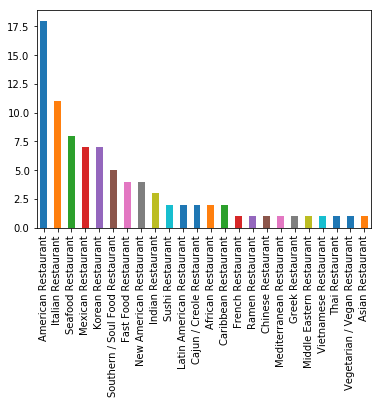

In [198]:
print('Cluster 1 with {} Neighborhoods.'.format(df1.shape[0]))
df1['1st Most Common Venue'].value_counts().plot('bar')

Cluster 2 with 20 Neighborhoods.


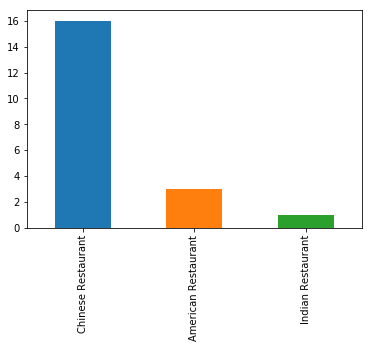

In [199]:
print('Cluster 2 with {} Neighborhoods.'.format(df2.shape[0]))
df2['1st Most Common Venue'].value_counts().plot('bar')

Cluster 3 with 22 Neighborhoods.


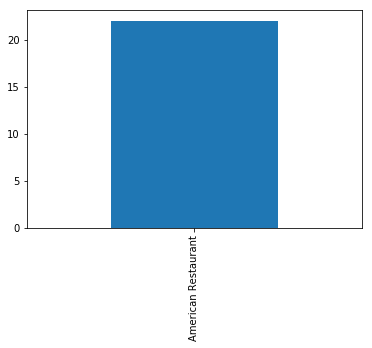

In [200]:
print('Cluster 3 with {} Neighborhoods.'.format(df3.shape[0]))
df3['1st Most Common Venue'].value_counts().plot('bar')

Cluster 4 with 18 Neighborhoods.


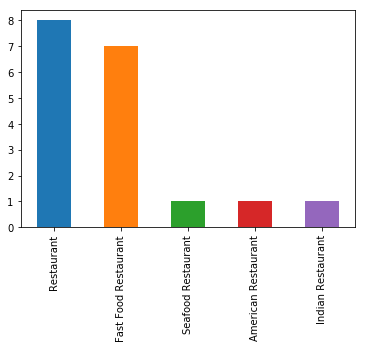

In [201]:
print('Cluster 4 with {} Neighborhoods.'.format(df4.shape[0]))
df4['1st Most Common Venue'].value_counts().plot('bar')

Cluster 5 with 20 Neighborhoods.


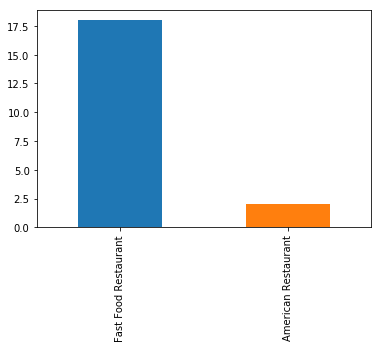

In [202]:
print('Cluster 5 with {} Neighborhoods.'.format(df5.shape[0]))
df5['1st Most Common Venue'].value_counts().plot('bar')